In [1]:
!pip install transformers sentencepiece

     |████████████████████████████████| 2.6 MB 8.5 MB/s 
     |████████████████████████████████| 1.2 MB 59.8 MB/s 
     |████████████████████████████████| 3.3 MB 62.4 MB/s 
     |████████████████████████████████| 636 kB 66.3 MB/s 
     |████████████████████████████████| 895 kB 81.7 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [2]:
!python -m pip install spacy==2.1.0
!python -m spacy download en

     |████████████████████████████████| 27.7 MB 82 kB/s 
     |████████████████████████████████| 82 kB 470 kB/s 
     |████████████████████████████████| 3.2 MB 43.8 MB/s 
     |████████████████████████████████| 2.1 MB 51.3 MB/s 
  Attempting uninstall: preshed
    Found existing installation: preshed 3.0.5
    Uninstalling preshed-3.0.5:
      Successfully uninstalled preshed-3.0.5
  Attempting uninstall: plac
    Found existing installation: plac 1.1.3
    Uninstalling plac-1.1.3:
      Successfully uninstalled plac-1.1.3
  Attempting uninstall: blis
    Found existing installation: blis 0.4.1
    Uninstalling blis-0.4.1:
      Successfully uninstalled blis-0.4.1
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
ERROR: pip's dependency resolve

In [3]:
!pip install keybert

     |████████████████████████████████| 85 kB 4.3 MB/s 
     |████████████████████████████████| 209 kB 20.8 MB/s 
     |████████████████████████████████| 51 kB 10.2 MB/s 
  Created wheel for keybert: filename=keybert-0.4.0-py3-none-any.whl size=20358 sha256=36dfad8bee813ba9b350a3ac85e7d65450692fb7d27a1245256e19cedb07c228
  Stored in directory: /root/.cache/pip/wheels/fe/e1/7f/8ee72e851e92320fba5c68d9e6e28d227671876429bc80f420
  Created wheel for sentence-transformers: filename=sentence_transformers-2.0.0-py3-none-any.whl size=126709 sha256=682a432b8c3bad91abd9d6bcba4b9c16cbebe39bd3bc861a7d0b2809047c5782
  Stored in directory: /root/.cache/pip/wheels/d1/c1/0f/faafd427f705c4b012274ba60d9a91d75830306811e1355293
Successfully built keybert sentence-transformers


# Set up

In [4]:
import requests

In [5]:
import numpy as np

from nltk.corpus import stopwords
from nltk import download

import gensim.downloader as api

import editdistance as edist

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import pairwise_distances
download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [6]:
import tensorflow as tf
from keybert import KeyBERT
import spacy

In [7]:
from transformers import pipeline, AutoTokenizer, TFAutoModelWithLMHead

In [8]:
def initialize(tokenizer_model_anem):

  summarizer = pipeline("summarization")
  qa = pipeline("question-answering")
  tokenizer = AutoTokenizer.from_pretrained(tokenizer_model_anem)
  KeyBERT_model = KeyBERT('distilbert-base-nli-mean-tokens')
  nlp = spacy.load("en_core_web_sm")
  return summarizer,tokenizer,KeyBERT_model,nlp,qa
summarizer,tokenizer,KeyBERT_model,nlp,qa_model = initialize('t5-small')

def init_wmd():
  wmd = api.load('word2vec-google-news-300')
  return wmd

In [9]:
wmd = init_wmd()

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [10]:
def summarize_with_pipeline(text, summarizer, **kwargs):
  inputs = tokenizer.encode(text, return_tensors="tf")
  length = inputs.shape[1]
  if length < 14:
    return text
  elif length > 1024:
    return ""
  output = summarizer(text,max_length=int(length*1/2), min_length=int(length*1/10),**kwargs)
  return output[0]['summary_text']

In [11]:
def get_text_from_wiki(title):
  page = requests.get(
        "https://en.wikipedia.org/w/api.php?action=query&format=json&titles=%s"
        "&prop=extracts&explaintext" % title).json()["query"]["pages"]
  if len(page.keys()) == 1:
    return "= "+ title.replace('_',' ') +" =\n" +next(iter(page.values()))["extract"]
  raise Exception("No article found")

In [12]:
import re
def normalize_text(text):
  Lines = text.split('\n')
  count = 0
  CurrentText = []
  data = []
  for line in Lines:
    count += 1
    txt = line
    x = re.sub("((=)+)", "=====", txt)
    if x.count("=====") == 2:
      if x.count("References") > 0:
        break
      level = txt.count('=')
      if len(CurrentText) > 0:
        data.append(CurrentText)
      data.append(txt)
      CurrentText= []
    else:
      if len(line.strip()) >0:
        CurrentText += [line.strip().replace("\n"," ")]
  if len(CurrentText) > 0:
      data.append(CurrentText)
  return data

# Generate mind map data structure

In [13]:
def gen_mind_map_data_structure(array_of_text):
  root = dict()
  curr_path = []
  lastLevel = 0
  for line in array_of_text:
    if isinstance(line, str):
      newLevel = line.count('=')/2
      newTopic = line.replace("=","").strip()
      if lastLevel == newLevel:
        curr_path = curr_path[:-1] + [newTopic]
        recur_crete_dict(curr_path,root)
      elif lastLevel < newLevel:
        curr_path += [newTopic]
        recur_crete_dict(curr_path,root)
      elif lastLevel > newLevel:
        curr_path = curr_path[:int(newLevel)-1] + [newTopic]
        recur_crete_dict(curr_path,root)
      lastLevel = newLevel
      #print(curr_path)
    else:
      #print(x)
      recur_crete_dict(curr_path,root,False,line)
  return root

def recur_crete_dict(array_path,dictionary,isTopic=True, currentLine=""):
  if len(array_path) == 1:
    if isTopic:
      dictionary[array_path[0]] = dict()
    elif not isTopic:
      #list(map(lambda x: gen_mindmap_from_sentence_helper(x,x, summarizer,[]) ,inputDict['!!paragraph'])) make it not loop the dictionary two times
      dictionary[array_path[0]]['!!paragraph'] = currentLine
  elif len(array_path) > 1:
    curr_dict = dictionary.get(array_path[0])
    recur_crete_dict(array_path[1:],curr_dict,isTopic,currentLine)

# Transfrom

In [14]:
def tranform_data_structure_to_mind_map(root):
  topicDict = root.get(list(root.keys())[0])
  print(build_result(topicDict))

def build_result(inputDict):
  allKey = list(inputDict.keys())
  if len(allKey) == 1 and allKey[0] == '!!paragraph':
    result = list(map(lambda x: gen_mindmap_from_sentence_helper(x,x, summarizer,[]) ,inputDict['!!paragraph']))
    inputDict['!!paragraph'] = list(filter(lambda x: (x != None),result))
  else:
    for key in filter(lambda x : x != '!!paragraph', allKey):
      build_result(inputDict[key])
    if '!!paragraph' in allKey:
      result = list(map(lambda x: gen_mindmap_from_sentence_helper(x,x, summarizer,[]) ,inputDict['!!paragraph']))
      inputDict['!!paragraph'] = list(filter(lambda x:(x != None),result))


In [15]:

def preprocess(sentence):
  return [w for w in sentence.lower().split() if w not in stop_words]

def gen_mindmap_from_sentence_helper(originalText,currSentence,summarizer,arr_map):
  summary = summarize_with_pipeline(currSentence,summarizer, do_sample=False)
  doc = nlp(summary)
  sents = list(doc.sents)
  if len(sents) <=7:
    keys = keyBert(currSentence)
    all_keys_child = []
    if keys:
      for key in keys:
        result_of_q = QA(originalText,key,['What is ','Where is '])
        key_map = {"keywords": key, "!!child": result_of_q}
        all_keys_child += [key_map]
      return all_keys_child
    else:
      return

  else:
    data = [sent.text for sent in sents]
    X = np.arange(len(data)).reshape(-1, 1)
    def distance(x, y):
      return wmd.wmdistance(preprocess(data[int(x[0])]), preprocess(data[int(y[0])]))
    proximity_matrix = pairwise_distances(X, X, metric=distance)
    best_k, best_cluster = clustering(X, proximity_matrix)
    if np.all(best_cluster == best_cluster[0]):
      keys = keyBert(currSentence)
      all_keys_child = []
      if keys:
        for key in keys:
          result_of_q = QA(originalText,key,['What is ','Where is '])
          key_map = {"keywords": key, "!!child": result_of_q}
          all_keys_child += [key_map]
        return all_keys_child
    return gen_mindmap_from_sentence_helper(originalText,sents.join(". "),summarizer,arr_map)

def QA(original,keyword, questions):
  ans_of_key = []
  for question in questions:
    q = question+keyword[0]+" ?"
    result = qa_model(question=q, context=original)
    if round(result['score'], 4) > 0.8:
      ans_of_key += [(q,result['answer'])]
  return ans_of_key



def keyBert(text):
  keys = KeyBERT_model.extract_keywords(text, keyphrase_ngram_range=(1, 5), stop_words='english', top_n=10)
  return [key for key in keys if key[1] > 0.65]

In [16]:
def clustering(X, total_sent,proximity_matrix):
  best_k = -1
  best_cluster = []
  total = int(total_sent/2)
  best_score = -100
  for n in range(2, total):
    algorithm = AgglomerativeClustering(n_clusters=n, affinity='precomputed',
                                  linkage='average')
    clusters = algorithm.fit_predict(proximity_matrix)
    score = silhouette_score(X, algorithm.labels_)
    if score > best_score:
      best_score = score
      best_k = n
      best_cluster = clusters

  return (best_k, best_cluster)

# Build mind map using python

In [17]:
import networkx as nx
import matplotlib.pyplot as plt

def print_graph_from_dict(dictData):
  G = nx.Graph()
  parentDict = dictData.get(list(dictData.keys())[0])
  rootName = list(dictData.keys())[0]
  G.add_node(rootName, label=rootName)
  build_graph_helper(parentDict,rootName,G)
  color_map = []
  for node in G:
    if node == rootName:
      color_map.append('orange')
    else: 
      color_map.append('skyblue')   

  pos = nx.spring_layout(G)
  plt.figure(figsize=(60, 60))
  nx.draw(G, pos, edge_color='black', width=1, linewidths=1,
            node_size=7000, node_color=color_map, alpha=0.9,
            labels={node: node for node in G.nodes()})
  plt.axis('off')
  plt.show()

def build_graph_helper(currentDice,parentName,graph):
  allKey = list(currentDice.keys())
  if len(allKey) == 1 and allKey[0] == '!!paragraph':
    for para_key in currentDice[allKey[0]]:
      # print(para_key)
      for keyword in para_key:
        graph.add_node(keyword['keywords'][0])
        graph.add_edge(parentName,keyword['keywords'][0])
        if len(keyword['!!child']) > 0:
          for child in keyword['!!child']:
            graph.add_node(child[1])
            graph.add_edge(keyword['keywords'][0],child[1])
  else:
    for key in filter(lambda x : x != '!!paragraph', allKey):
      graph.add_node(key)
      graph.add_edge(parentName,key)
      build_graph_helper(currentDice[key],key,graph)

In [18]:
import networkx as nx
import matplotlib.pyplot as plt

def print_graph_from_dict_for_semi_struct(dictData):
  G = nx.Graph()
  parentDict = dictData.get(list(dictData.keys())[0])
  rootName = list(dictData.keys())[0]
  G.add_node(rootName, label=rootName)
  all_key = list(parentDict.keys())
  if "!!paragraph" in all_key:
    print("add general")
    G.add_node("general")
    G.add_edge(rootName,"general")
    for para_key in parentDict['!!paragraph']:
      for keyword in para_key:
        G.add_node(keyword['keywords'][0])
        G.add_edge("general",keyword['keywords'][0])
        if len(keyword['!!child']) > 0:
          for child in keyword['!!child']:
            G.add_node(child[1])
            G.add_edge(keyword['keywords'][0],child[1])
    parentDict.pop('!!paragraph', None)

  build_graph_helper_semi_struct(parentDict,rootName,G)
  color_map = []
  for node in G:
    if node == rootName:
      color_map.append('orange')
    else: 
      color_map.append('skyblue')   

  pos = nx.spring_layout(G)
  plt.figure(figsize=(60, 60))
  nx.draw(G, pos, edge_color='black', width=1, linewidths=1,
            node_size=7000, node_color=color_map, alpha=0.9,
            labels={node: node for node in G.nodes()})
  plt.axis('off')
  plt.show()

def build_graph_helper_semi_struct(currentDice,parentName,graph):
  allKey = list(currentDice.keys())
  if len(allKey) == 1 and allKey[0] == '!!paragraph':
    for para_key in currentDice[allKey[0]]:
      for keyword in para_key:
        graph.add_node(keyword['keywords'][0])
        graph.add_edge(parentName,keyword['keywords'][0])
        if len(keyword['!!child']) > 0:
          for child in keyword['!!child']:
            graph.add_node(child[1])
            graph.add_edge(keyword['keywords'][0],child[1])
  else:
    for key in allKey:
      if key == '!!paragraph':
        
        for para_key in currentDice[allKey[0]]:
          for keyword in para_key:
            graph.add_node(keyword['keywords'][0])
            graph.add_edge(parentName,keyword['keywords'][0])
            if len(keyword['!!child']) > 0:
              for child in keyword['!!child']:
                graph.add_node(child[1])
                graph.add_edge(keyword['keywords'][0],child[1])
      else:
        graph.add_node(key)
        graph.add_edge(parentName,key)
        build_graph_helper_semi_struct(currentDice[key],key,graph)

# Semi-structure

In [19]:
normalize_text(get_text_from_wiki("""King_Mongkut's_University_of_Technology_Thonburi"""))

["= King Mongkut's University of Technology Thonburi =",
 ['King Mongkut\'s University of Technology Thonburi (KMUTT, Thai: มหาวิทยาลัยเทคโนโลยีพระจอมเกล้าธนบุรี; RTGS: maha witthayalai theknoloyi phrachomklao thonburi ) or colloquially "Bangmod" (Thai: บางมด; RTGS: bang mot ) is an engineering and technology university in Thailand, focusing on teaching and research. It is one of nine national research universities (NRU) in Thailand. It is in Bang Mot Sub-district, Thung Khru District, Bangkok. It was founded on 18 April 1960, making it the third oldest engineering school and seventh oldest university in Thailand.'],
 '== History ==',
 ["King Mongkut's University of Technology Thonburi can trace its origin to the Thonburi Technical College (TTC) which was established on 4 February 1960, by the Department of Vocational Education, Ministry of Education. TTC had the mission of training technicians, technical instructors, and technologists. By virtue of the Technology Act, enacted 21 April

In [20]:
gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""King_Mongkut's_University_of_Technology_Thonburi""")))

{"King Mongkut's University of Technology Thonburi": {'!!paragraph': ['King Mongkut\'s University of Technology Thonburi (KMUTT, Thai: มหาวิทยาลัยเทคโนโลยีพระจอมเกล้าธนบุรี; RTGS: maha witthayalai theknoloyi phrachomklao thonburi ) or colloquially "Bangmod" (Thai: บางมด; RTGS: bang mot ) is an engineering and technology university in Thailand, focusing on teaching and research. It is one of nine national research universities (NRU) in Thailand. It is in Bang Mot Sub-district, Thung Khru District, Bangkok. It was founded on 18 April 1960, making it the third oldest engineering school and seventh oldest university in Thailand.'],
  'Campuses': {'Bang Khun Thian Campus': {'!!paragraph': ["The Bang Khun Thian Campus, 80 acres (0.32 km2) in size, contains the School of Architecture and Design, the School of Bioresources and Technology, the Pilot Plant Development and Training Institute, and the Industrial Park. It is in Bangkok's Bang Khun Thian District."]},
   'Bangmod main campus': {'!!p

In [21]:
kmutt_dict = gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""King_Mongkut's_University_of_Technology_Thonburi""")))
tranform_data_structure_to_mind_map(kmutt_dict)
kmutt_dict

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


None


{"King Mongkut's University of Technology Thonburi": {'!!paragraph': [[{'!!child': [],
     'keywords': ('school seventh oldest university thailand', 0.7616)},
    {'!!child': [],
     'keywords': ('seventh oldest university thailand', 0.7565)},
    {'!!child': [], 'keywords': ('oldest university thailand', 0.7378)},
    {'!!child': [],
     'keywords': ('engineering school seventh oldest university', 0.6817)},
    {'!!child': [('What is engineering technology university thailand focusing ?',
       'teaching and research'),
      ('Where is engineering technology university thailand focusing ?',
       'Thailand')],
     'keywords': ('engineering technology university thailand focusing',
      0.6641)},
    {'!!child': [('Where is mot engineering technology university thailand ?',
       'Thailand')],
     'keywords': ('mot engineering technology university thailand', 0.659)},
    {'!!child': [],
     'keywords': ('national research universities nru thailand', 0.6562)},
    {'!!child'

add general


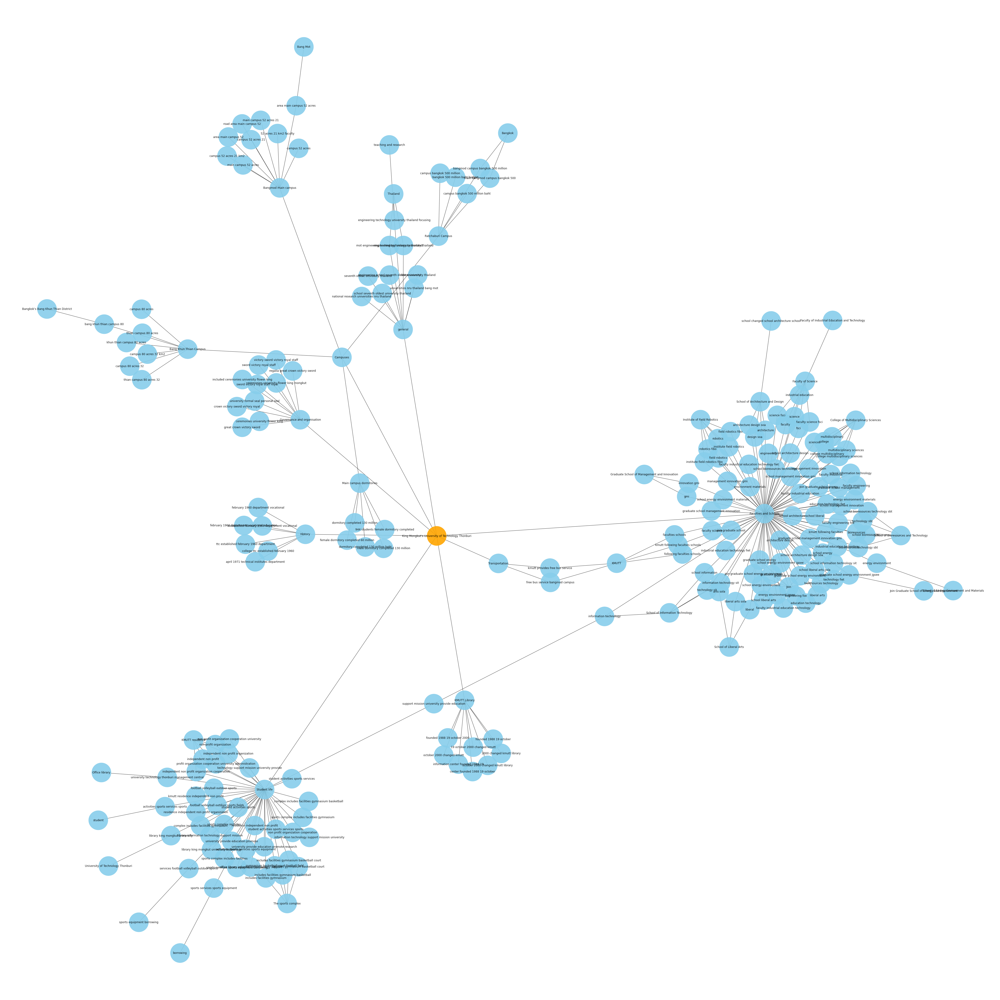

In [22]:
print_graph_from_dict_for_semi_struct(kmutt_dict)

In [ ]:
gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""Steve_Jobs""")))

{'Steve Jobs': {'!!paragraph': ["Steven Paul Jobs (; February 24, 1955 – October 5, 2011) was an American business magnate, industrial designer, investor, and media proprietor. He was the chairman, chief executive officer (CEO), and co-founder of Apple Inc.; the chairman and majority shareholder of Pixar; a member of The Walt Disney Company's board of directors following its acquisition of Pixar; and the founder, chairman, and CEO of NeXT. Jobs is widely recognized as a pioneer of the personal computer revolution of the 1970s and 1980s, along with his early business partner and fellow Apple co-founder Steve Wozniak.",
   'Jobs was born in San Francisco, California, and put up for adoption. He was raised in the San Francisco Bay Area. He attended Reed College in 1972 before dropping out that same year, and traveled through India in 1974 seeking enlightenment and studying Zen Buddhism.',
   "Jobs and Wozniak co-founded Apple in 1976 to sell Wozniak's Apple I personal computer. Together t

In [ ]:
steave_dict = gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""Steve_Jobs""")))
tranform_data_structure_to_mind_map(steave_dict)
steave_dict

Token indices sequence length is longer than the specified maximum sequence length for this model (566 > 512). Running this sequence through the model will result in indexing errors


None


{'Steve Jobs': {'!!paragraph': [[{'!!child': [('What is ceo founder apple chairman majority ?',
       'Pixar')],
     'keywords': ('ceo founder apple chairman majority', 0.8067)},
    {'!!child': [],
     'keywords': ('officer ceo founder apple chairman', 0.7885)},
    {'!!child': [('What is founder apple chairman majority shareholder ?',
       'Pixar'),
      ('Where is founder apple chairman majority shareholder ?', 'Pixar')],
     'keywords': ('founder apple chairman majority shareholder', 0.7878)},
    {'!!child': [('What is ceo founder apple chairman ?', 'Steve Wozniak')],
     'keywords': ('ceo founder apple chairman', 0.7821)},
    {'!!child': [('What is apple chairman majority shareholder pixar ?',
       'Pixar')],
     'keywords': ('apple chairman majority shareholder pixar', 0.7755)},
    {'!!child': [], 'keywords': ('pixar founder chairman ceo jobs', 0.7717)},
    {'!!child': [],
     'keywords': ('executive officer ceo founder apple', 0.7657)},
    {'!!child': [('What is

add general


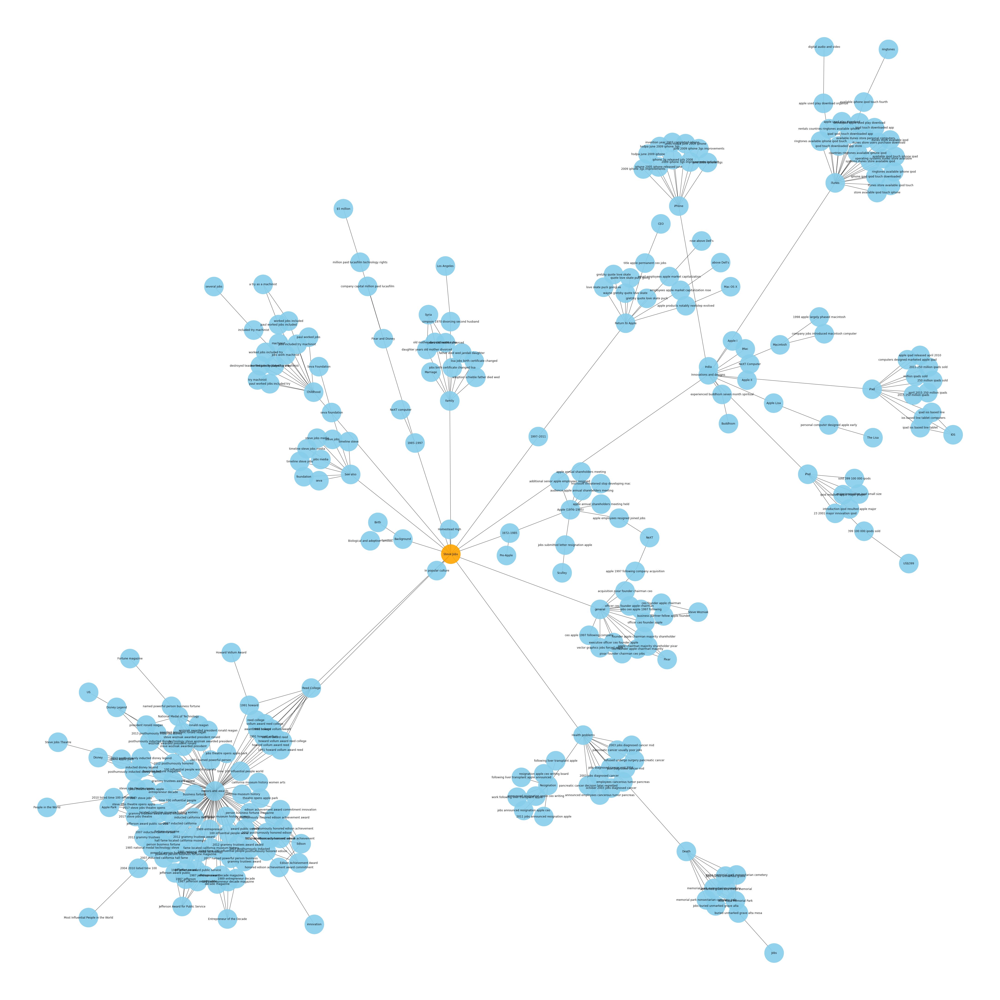

In [ ]:
print_graph_from_dict_for_semi_struct(steave_dict)

In [ ]:
gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""Pol%27and%27Rock_Festival""")))

{'Pol%27and%27Rock Festival': {'!!paragraph': ['Pol\'and\'Rock Festival, formerly known as Woodstock Festival Poland (Polish: Przystanek Woodstock; "Woodstock Station"; English-language materials often referred to it simply to the Woodstock Festival Poland) is an annual free rock music festival in Poland, inspired by the Woodstock festival. The festival has been held since 1995.  In 2009 Woodstock Festival Poland gathered an audience of  over 400,000 people, in 2011 the attendance was above 700,000, in 2012 about 550,000 people, in 2013 about 500,000 and in 2014 the attendance reached a record high of about 750,000. As of 2019, the aggregate attendance of the festival is 750,000 making it one of the biggest music festivals in the world.'],
  'Background': {'!!paragraph': ['The festival was initiated in 1994 by Jerzy Owsiak after his trip to the United States where he attended the Woodstock Festival, which was held after a 25-year hiatus. The festival\'s official motto is Love, Friendsh

In [ ]:
Pol_dict = gen_mind_map_data_structure(normalize_text(get_text_from_wiki("""Pol%27and%27Rock_Festival""")))
tranform_data_structure_to_mind_map(Pol_dict)
Pol_dict

None


{'Pol%27and%27Rock Festival': {'!!paragraph': [[{'!!child': [],
     'keywords': ('1995 2009 woodstock festival poland', 0.7332)},
    {'!!child': [],
     'keywords': ('simply woodstock festival poland annual', 0.7321)},
    {'!!child': [],
     'keywords': ('woodstock festival poland annual free', 0.7299)},
    {'!!child': [], 'keywords': ('woodstock festival poland annual', 0.729)},
    {'!!child': [],
     'keywords': ('2009 woodstock festival poland gathered', 0.7208)},
    {'!!child': [],
     'keywords': ('woodstock festival poland gathered audience', 0.719)},
    {'!!child': [('Where is festival poland annual free rock ?', 'Poland')],
     'keywords': ('festival poland annual free rock', 0.7161)},
    {'!!child': [], 'keywords': ('annual free rock music festival', 0.7104)},
    {'!!child': [], 'keywords': ('2009 woodstock festival poland', 0.705)},
    {'!!child': [],
     'keywords': ('music festival poland inspired woodstock', 0.7031)}]],
  'Background': {'!!paragraph': [[{'!

add general


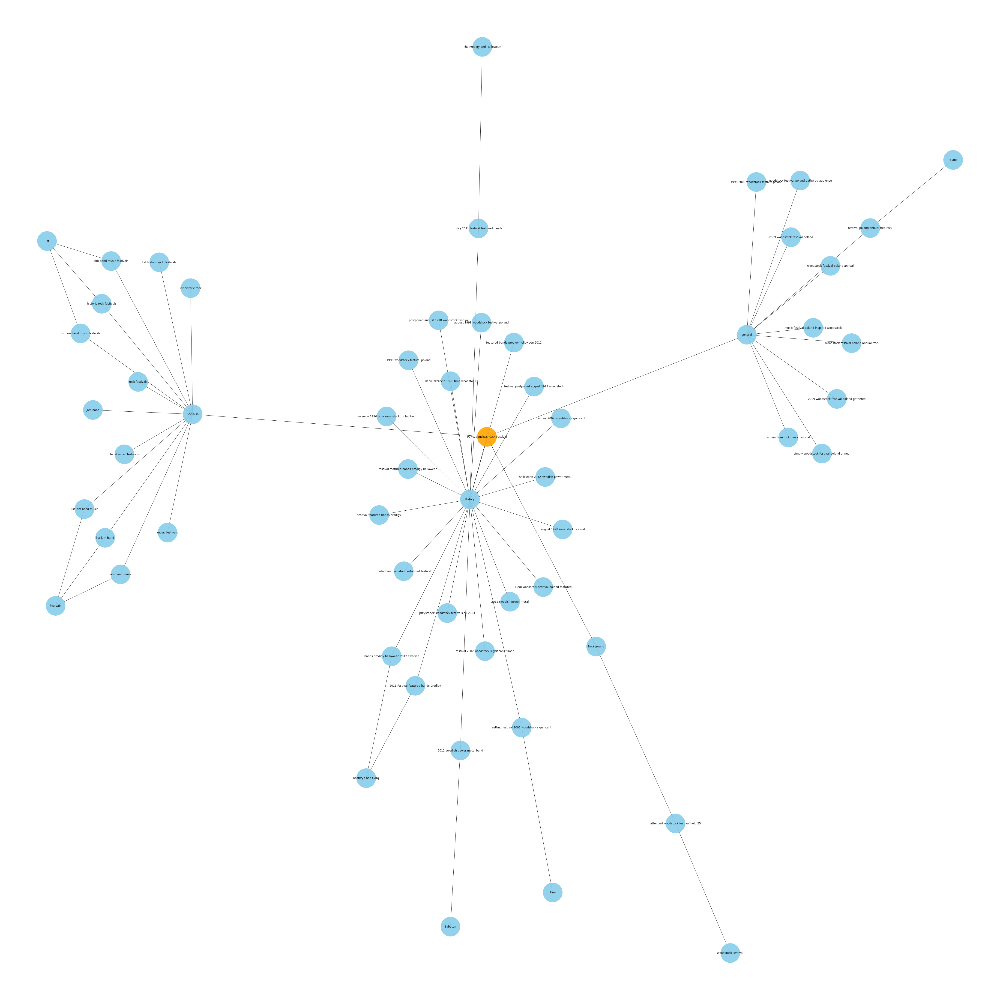

In [ ]:
print_graph_from_dict_for_semi_struct(Pol_dict)

# Unstructure text 

In [ ]:
def gen_mind_map_data_structure_from_unstruc_text(title,text):
  arr_of_para = [para.strip() for para in text.split("\n") if len(para.strip())>0]
  return {title: {
      "!!paragraph": arr_of_para
  }}

In [ ]:
title = """News - Apple helps Encircle expand its support for LGBTQ+ youth and their families"""
text = """
In the summer of 2017, the Toelupe family heard about a little blue house in Provo, Utah, called Encircle. The nonprofit had a simple message, “No sides, only love” — and in the years to come, Encircle would prove to be part second home, part sanctuary, and the entry point to a community Micah Toelupe credits with saving his life. 
As one of only a handful of gay students at his high school in rural Utah, Micah was struggling with depression, anxiety, and social isolation. That’s why stepping through the front doors of Encircle — where he felt like “one of a billion” instead of one of a few — felt so different.
“The effect it had here is so insane,” says Micah. “It really did save my life. You could walk right into the house and be surrounded by people who are going to love and respect who you are. It was always there, and you were always welcome.” 
Encircle, a Utah-based nonprofit, was founded in 2017 to help young LGBTQ+ people and their families find support and a sense of belonging at community resource houses across the state. This month, the nonprofit launched a new campaign that leaders in business, music, and technology are rallying behind, with new donations from Apple, Qualtrics founder Ryan Smith and his wife, Ashley — who also own the Utah Jazz — and Imagine Dragons’s lead singer Dan Reynolds and his wife, musician Aja Volkman.
The donations — valued at $4 million — will help kickstart Encircle’s national expansion, with new community resource houses in Utah, Idaho, Nevada, and Arizona. In addition to a $1 million contribution, Apple will be donating iPads and other products to help expand Encircle’s virtual programming and inspire new pathways for digital connection, creativity, and education.
Encircle helps young people and their families through a number of services, including free and subsidized therapy sessions, Friendship Circles that create safe spaces and foster community, and an open door policy that helps everyone who walks through their doors feel welcomed and accepted. 
The pandemic has meant moving many of those services online, but it hasn’t dulled the urgency or importance of support systems that help young people who are cut off from their friends, often feeling more isolated than ever. The technology donations will make a meaningful difference in the nonprofit’s ability to reach LGBTQ+ youth where they are, helping create community beyond the four walls of an Encircle home.
Encircle has already helped countless families across Utah. Chrisann and Packard Toelupe have two LGBTQ-identified children — their son Micah and their daughter, Khristian. When Khristian shared her gender identity with her parents, Encircle helped the Toelupes find supportive resources and connect with other families looking to build community. 
“Encircle gave me the confidence to be an advocate for my child, because I saw so many other parents being advocates for their children,” says Chrisann. “It was very lonely at first. But here was this whole network of people that I could call. You meet these other families, and you realize you’re not alone.” 
Encircle is helping to meet an urgent need. More than half of LGBTQ youth are battling symptoms of depression, and four out of 10 LGBTQ+ people report having seriously considered suicide in the past 12 months. Still, nearly half of LGBTQ+ young people say they’ve been unable to access mental health counseling over the last year. 
Encircle has taken on a supportive role not just for young people, but for their families — making space for love, understanding, and acceptance. The nonprofit prides itself on being a part of the communities it serves, even and especially in areas where LGBTQ+ youth feel uncomfortable or afraid to share their full selves.
By any measure, Encircle’s model has worked — more than 10,000 guests visit each Encircle home every year. With counseling services, music nights, community service projects, and other bonding activities, Encircle has been a crucial lifeline to young people facing isolation or depression.
Luckily for the Toelupes, Encircle opened a house in Provo in 2017, just 20 minutes from their home. And while there were some local resources for young LGBTQ+ people, few had such a profound impact on their family and neighbors across Utah County. 
When the Toelupes first told their daughter about Encircle, Khristian was on her mission in the Philippines. When she returned home, she found a support system unlike anything she could’ve imagined — and a community that accepted and supported her for who she is. 
“I was just bawling,” Khristian says. “I thought, ‘Wow, I didn’t think that I could feel all this love at once.’ Every time that I go to Encircle it’s time that I can actually breathe. I can just be — without having to worry about opinions or my own safety.”
Encircle’s mission is not only to serve families but also be a great neighbor and community member. The nonprofit has helped foster a deeper understanding and appreciation for a diversity of experiences and identities. According to Micah, it isn’t uncommon for students to drive hours at a time just to spend a little while at an Encircle house.
“Encircle had this snowball effect,” Micah says. “I started going and it saved my life, and then my counselors at my school found out about it. It was saving other kids’ lives. The Friendship Circles grew from two people in the first group to 20 kids in the room.” 
Not everyone who visits has the support of their family, but Encircle’s focus on welcoming everyone has made it a lifeline for LGBTQ+ youth with a range of experiences. Savannah Harman interned at Encircle’s Salt Lake City house, where Friendship Circles and other community-building activities helped her find supportive friends from all walks of life. 
“I found a lovely chosen family,” Savannah says. “Because Encircle is family oriented, it allows space for you even if you don’t bring your family. You will find your family there.” 
For Micah, Encircle helped him gain the confidence and skills to grow as an artist, with classes and exhibitions that helped him share his work with the world. One of those pieces — a watercolor painting — is something of a self-portrait. Micah’s mom was an enthusiastic first customer, and the piece, which Micah never named, now hangs in the Toelupes’ living room.
“Every time I walk past it, I just think, ‘Becoming,’” Chrisann says. “Because it’s like Micah becoming himself. And that’s what Encircle, to me, did for him. He blossomed into Micah — his authentic self.” 
To learn more about Encircle or find out how to contribute, visit encircletogether.org.
"""

In [ ]:
gen_mind_map_data_structure_from_unstruc_text(title,text)

{'News - Apple helps Encircle expand its support for LGBTQ+ youth and their families': {'!!paragraph': ['In the summer of 2017, the Toelupe family heard about a little blue house in Provo, Utah, called Encircle. The nonprofit had a simple message, “No sides, only love” — and in the years to come, Encircle would prove to be part second home, part sanctuary, and the entry point to a community Micah Toelupe credits with saving his life.',
   'As one of only a handful of gay students at his high school in rural Utah, Micah was struggling with depression, anxiety, and social isolation. That’s why stepping through the front doors of Encircle — where he felt like “one of a billion” instead of one of a few — felt so different.',
   '“The effect it had here is so insane,” says Micah. “It really did save my life. You could walk right into the house and be surrounded by people who are going to love and respect who you are. It was always there, and you were always welcome.”',
   'Encircle, a Utah-

In [ ]:
apple_dict = gen_mind_map_data_structure_from_unstruc_text(title,text)
tranform_data_structure_to_mind_map(apple_dict)
apple_dict

None


{'News - Apple helps Encircle expand its support for LGBTQ+ youth and their families': {'!!paragraph': [[{'!!child': [],
     'keywords': ('handful gay students high school', 0.7054)}],
   [{'!!child': [], 'keywords': ('micah really did save life', 0.668)}],
   [{'!!child': [('What is founded 2017 help young lgbtq ?', 'Encircle')],
     'keywords': ('founded 2017 help young lgbtq', 0.672)},
    {'!!child': [], 'keywords': ('2017 help young lgbtq people', 0.6528)}],
   [{'!!child': [],
     'keywords': ('donations valued million help kickstart', 0.7114)},
    {'!!child': [],
     'keywords': ('donating ipads products help expand', 0.7094)},
    {'!!child': [],
     'keywords': ('million contribution apple donating ipads', 0.667)}],
   [{'!!child': [('Where is families number services including free ?',
       'Encircle')],
     'keywords': ('families number services including free', 0.7287)},
    {'!!child': [('What is safe spaces foster community open ?',
       'Friendship Circles'),


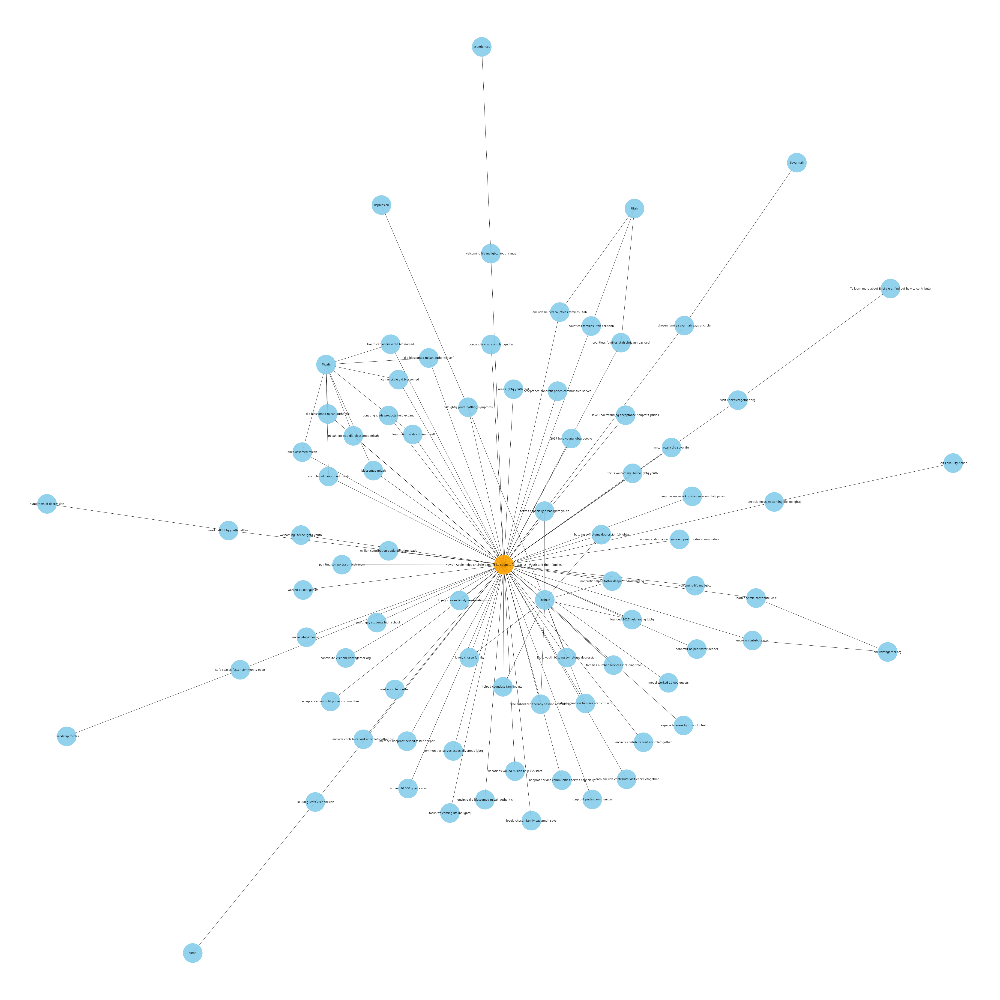

In [ ]:
print_graph_from_dict(apple_dict)

In [ ]:
china_title = """News - China starts large-scale testing of its internet of the future"""
china_text= """
HONG KONG: China launched a large-scale experimental network in Beijing on Tuesday to test the future of internet technology over the next five to 10 years.

Headquartered at Tsinghua University, the "future internet technology infrastructure" connects 40 of the country's leading research universities with huge bandwidth and far lower latency than the existing internet, according to state news agency Xinhua.

It will serve as a backbone network for the China Environment for Network Innovations (CENI), a national research facility connecting the largest cities in China, to verify its performance and the security of future network communications technology before commercial use.

When completed in 2023, the CENI facility will become a prototype "future internet" connecting to almost everything - from computers at home to cars on the street - for seamless communications in an AI-driven society.
 
"We will throw a lot of punches at it. The future internet must be able to stand firmly against attacks. It matters to the foundation of our national security," said a computer scientist involved with the project at Tsinghua who asked not to be named, due to the project's sensitivity.

China's internet was built with Western technology and is riddled with back doors. The US government's Prism project, for instance, exploited these weaknesses to infiltrate Chinese government and research institutes, including Tsinghua, according to US whistle-blower Edward Snowden.

After the Snowden revelations, Beijing launched a massive effort to replace the Western hardware in its information infrastructure. In recent years, a number of Chinese telecommunication companies, including Huawei Technologies Co, overtook their Western competitors in 5G and other cutting-edge technologies. But their technological lead was limited to certain fields and overseas software and protocols continued to prevail in Chinese networks.

The US government has also launched various experimental networks, including the Global Environment for Network Innovations (GENI), to maintain its overall lead in network technology. Other players, including the European Union, Japan, and South Korea have launched similar projects.

According to Tan Hang, a lead CENI scientist with China Unicom, construction of China's experimental network began in 2019. The Chinese facility aims to rival the US GENI programme with completely different technology. China will, for example, develop a brand new operating system to manage the data flow and "talk" between different devices on the future internet, with the support of home-built hardware ranging from routers, servers to computer chips, he said.

The 1.7 billion yuan (8 billion baht) infrastructure will "enhance our nation's competitiveness and enable us to take the initiative in international competition in cyberspace," Tan said, in a paper published by a domestic academic journal in August. He added that the CENI platform would support the testing of new internet technology "five to 10 years ahead of the industry".

China is already building the world's largest 5G network and, in the near future, expects a large number of smart devices - including autonomous driving cars - will connect to the internet. These devices could produce and demand a huge amount of data, tolerate little delay in communication and each need a unique ID. According to Tan, the current internet structure, based on military technology dating back to the 1980s, will not be able to handle future requirements.

The more things are connected to the internet, the greater damage a cyberattack could cause. New security protocols developed by Chinese researchers to locate and verify every device in the future network will be tested on the CENI network, among other cybersecurity innovations, Tan said.

The network "will support offensive or defensive drills" by allowing more than 4,000 teams from across the country to conduct separate experiments at the same time, he added.

The Chinese network will not be isolated, but will connect to the existing internet as well as to experimental networks in other countries, including the Future Internet Research and Experimentation (FIRE) network in Europe, according to the EU.

In Nanning, capital city of the southwestern province of Guangxi, a regional hub is under construction to connect the CENI network to Asean countries, according to a local researcher. The outreach aims to expand the influence of China's most advanced information infrastructure to neighbouring countries including Cambodia, Laos, Myanmar and Thailand, the researcher said.
"""

In [ ]:
gen_mind_map_data_structure_from_unstruc_text(china_title,china_text)

{'News - China starts large-scale testing of its internet of the future': {'!!paragraph': ['HONG KONG: China launched a large-scale experimental network in Beijing on Tuesday to test the future of internet technology over the next five to 10 years.',
   'Headquartered at Tsinghua University, the "future internet technology infrastructure" connects 40 of the country\'s leading research universities with huge bandwidth and far lower latency than the existing internet, according to state news agency Xinhua.',
   'It will serve as a backbone network for the China Environment for Network Innovations (CENI), a national research facility connecting the largest cities in China, to verify its performance and the security of future network communications technology before commercial use.',
   'When completed in 2023, the CENI facility will become a prototype "future internet" connecting to almost everything - from computers at home to cars on the street - for seamless communications in an AI-dri

In [ ]:
china_dict = gen_mind_map_data_structure_from_unstruc_text(china_title,china_text)
tranform_data_structure_to_mind_map(china_dict)
china_dict

None


{'News - China starts large-scale testing of its internet of the future': {'!!paragraph': [[{'!!child': [('Where is beijing tuesday test future internet ?',
       'Beijing')],
     'keywords': ('beijing tuesday test future internet', 0.7852)},
    {'!!child': [('Where is tuesday test future internet technology ?',
       'Beijing')],
     'keywords': ('tuesday test future internet technology', 0.7519)},
    {'!!child': [('Where is experimental network beijing tuesday test ?',
       'Beijing')],
     'keywords': ('experimental network beijing tuesday test', 0.7215)},
    {'!!child': [('Where is scale experimental network beijing tuesday ?',
       'Beijing')],
     'keywords': ('scale experimental network beijing tuesday', 0.703)},
    {'!!child': [('What is network beijing tuesday test future ?',
       'internet technology'),
      ('Where is network beijing tuesday test future ?', 'Beijing')],
     'keywords': ('network beijing tuesday test future', 0.6909)},
    {'!!child': [('Wha

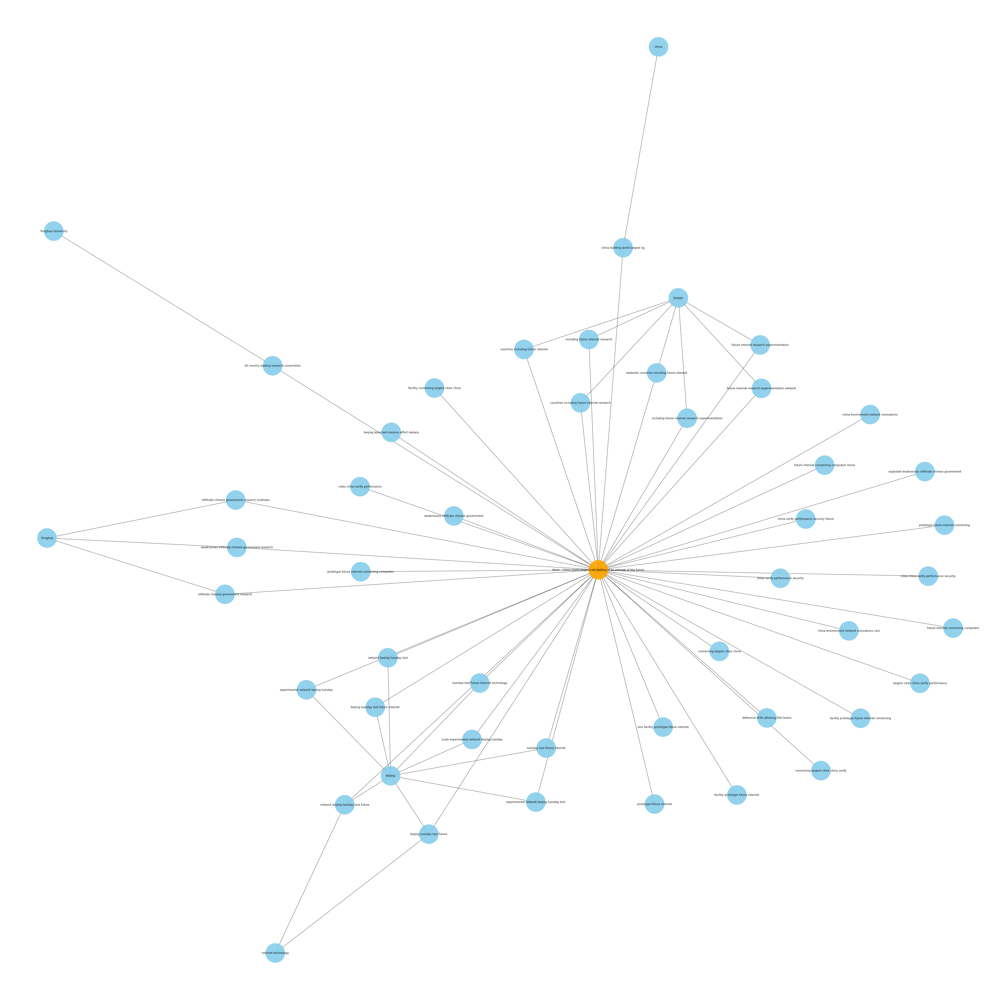

In [ ]:
print_graph_from_dict(china_dict)

In [ ]:
bbc_title = """BBC Editorial - How multitasking fuels original thinking"""
bbc_text= """
Multitasking is generally seen as a stressor that reduces performance. But busy periods of juggling tasks can actually fuel our creativity.
W
Whenever I sit down to write, I like to clear long periods for concentrated work. No emails, phone calls or meetings – just me and the blank page. If I do have to tackle many other tasks, I try to have a short break to cleanse my mind before I begin again. That’s because I always assumed that creativity was dependent on entering ‘the zone’ – and that required a kind of meditative peace and quiet beforehand. 
 
However, it seems I may have been completely mistaken in my approach. According to a  compelling new study, busy periods of multitasking – just the kind of activities I try to avoid – can actually fuel our subsequent creativity. Thanks to a “spillover effect”, the energy and excitement of hectic jobs can lead to more original idea generation. 
 
Importantly, this brain boost seems to apply to many different types of creation – from the generation of original business plans to the culinary flourishes of expert chefs – suggesting that people of many different professions might benefit. 
 
Shimul Melwani, a professor of organisational behaviour at University of North Carolina’s Kenan-Flagler Business School, who co-authored the paper with her PhD student Chaitali Kapadia, says the findings show that we can all be “a bit more opportunistic in the way we use multitasking”. And perhaps we’ll come to see our busiest moments as a force for innovation, rather than a cause of stress. 
 
Cognitive costs 
 
In the past, psychologists have taken a decidedly dim view of multitasking. Myriad studies have shown that the brain struggles to juggle two activities at once, and instead moves quickly between them – with a loss in accuracy each time it shifts its attention. If you are writing an email as you talk on the phone, for example, you temporarily lose the capacity to process the conversation as you type out the sentence. “You more or less become a little bit deaf,” says Iring Koch, a psychology professor at RWTH Aachen University in Germany. Alternatively, the shift in focus will lead to a momentary lapse in your writing, resulting in a typo or a non-sequitur. For optimum accuracy, you should therefore devote your full attention to each activity in turn.
 
These studies all focused on the immediate consequences of multitasking, however, whereas Melwani and Kapadia were interested in what came after. Creativity often involves tying together disparate thoughts and ideas, and that can benefit from a more diffuse mindset, rather than a rigid focus. We know, for instance, that asking people to contemplate contradictory ideas and conflicting perspectives can increase the flexibility and originality of their thinking for precisely this reason.

“When people are holding two separate pieces of information in their head, they’re somehow able to act and engage in more creative ways,” explains Melwani – and it seemed to make sense that multitasking could have a similar effect.

Multitasking can also lead us to feel energised and alert. This is reflected in our physiology; the more tasks we attempt to do, the higher our heart rate, for example. That energy, the researchers suspected, could also improve the generation of ideas.

Cooking up a storm

Melwani and Kapadia put this to test in a string of experiments. The first experiment had students take part in a conference call and respond to email. To examine the effects of multitasking, some of the students were asked to answer the email while they took part in the conference call, while others were allowed to do the two tasks sequentially – without any mental juggling.

Afterwards, the participants all took the alternative uses test (AUT) – a standard measure of creativity that involves finding new ways to use a familiar household object, like a brick. They might suggest that it is a paperweight, for example, or a weapon, or a diving aid – answers that were then rated for their originality by independent judges. In line with their theory, Melwani and Kapadia found that the multitasking students did indeed come up with more novel ideas than those who had been allowed to focus on each task in turn.

Importantly, the researchers also tested the participants on a word game that required analytical rather than creative thinking – but saw no improvement in their performance. This shows that there’s something unique about the creative process itself that was affected.
 
For further evidence, the researchers next turned to the TV cooking show Chopped. In each episode, professional chefs are presented with sets of “mystery ingredients” and asked to design and cook appetisers, entrees and desserts based on what they are given. Cooking each dish requires a certain amount of multitasking – and Melwani and Kapadia wanted to see whether this would affect the chefs’ inventiveness in the next round.

“It was almost perfectly designed for the type of creativity that we wanted to explore,” says Kapadia, who is now an assistant professor at Florida International University, US.

To test their hypothesis, the researchers recruited professional chefs to judge the contestants’ multitasking and the creativity of their recipes. The results were once again exactly as they had predicted. Chefs who multitasked more during the appetiser round designed more original entrées, and those who multitasked more in the entrée round tended to make more inventive desserts.

Intrigued, Kapadia contacted some of the contestants to discuss their experiences on the show. Anecdotally, their experiences certainly seemed to fit with their theory – that the multitasking left them feeling energised, which in turn helped to inspire their later creativity. “It fit with our model really well.”
 
Melwani and Kapadia’s final experiments aimed to tease apart that mechanism in more detail. They surveyed 105 waiters and waitresses at their local restaurants, on both busy (Friday and Saturday) and sleepy (Tuesday and Wednesday) evenings. The staff were asked to assess their energy levels – whether they felt “amped-up” and “stimulated”. They also took the alternative uses test and, additionally, were asked to draw a picture of an alien from another galaxy, which was again judged on its originality. (Those with more human-like features were considered less original than those with unusual sensory organs.) 
 
Confirming their theory, the researchers found that the busier the restaurant staff had been, and the more they had needed to multitask during their shift, the more energised they felt. This, in turn, increased the flexibility of their thinking on the AUT and the novelty of their aliens. Exactly the same “spillover effect” could be seen in business school students designing toys; the more they multitasked, the more “activated” they felt and the higher the quality of their subsequent ideas. 
 
Opportunistic ideation 
 
Melwani and Kapadia’s findings coincide with an intriguing study from Stephen Wee Hun Lim at the National University of Singapore. He found that people’s reported levels of “media multitasking” – the habit of sending a WhatsApp or checking TikTok while watching TV, for example – correlated with measures of creativity, such as the AUT. Further research will be needed to prove a causal link, but it is possible that the regular juggling of multiple media could lead the brain to be a bit more flexible in its thinking, he says.
Recognising these potential benefits of multitasking might help us to frame our busiest moments a bit more positively
How can we apply this ourselves? Melwani is reluctant to suggest that we should actively pursue more multitasking, if it is unnecessary – since it can increase our stress levels. Instead, she suggests that we are a bit more “opportunistic” in the ways we schedule our days. She has applied this idea herself during the pandemic, using the dual demands of home working and her children’s virtual schooling, responsibility for which she shares with her husband. “My life has involved much more chronic multitasking than I’d ever imagined,” she says. 
 
Melwani now deliberately schedules a more creative task after a period of home-schooling, so that the energy and increased cognitive flexibility will “spill over” into her idea generation and execution. Managers might do well to remember this too: scheduling a brainstorm after another energising task, for example. 
 
Recognising these potential benefits of multitasking might help us to frame our busiest moments a bit more positively. “It could increase our sense of efficacy,” says Melwani. We’ve already seen how procrastination can be rehabilitated thanks to its creative benefits; now it seems that multitasking may be due a similar image change. “It is nice to know that it isn’t always bad.”
"""

In [ ]:
gen_mind_map_data_structure_from_unstruc_text(bbc_title,bbc_text)

{'BBC Editorial - How multitasking fuels original thinking': {'!!paragraph': ['Multitasking is generally seen as a stressor that reduces performance. But busy periods of juggling tasks can actually fuel our creativity.',
   'W',
   'Whenever I sit down to write, I like to clear long periods for concentrated work. No emails, phone calls or meetings – just me and the blank page. If I do have to tackle many other tasks, I try to have a short break to cleanse my mind before I begin again. That’s because I always assumed that creativity was dependent on entering ‘the zone’ – and that required a kind of meditative peace and quiet beforehand.',
   'However, it seems I may have been completely mistaken in my approach. According to a  compelling new study, busy periods of multitasking – just the kind of activities I try to avoid – can actually fuel our subsequent creativity. Thanks to a “spillover effect”, the energy and excitement of hectic jobs can lead to more original idea generation.',
   

In [ ]:
bbc_dict = gen_mind_map_data_structure_from_unstruc_text(bbc_title,bbc_text)
tranform_data_structure_to_mind_map(bbc_dict)
bbc_dict

None


{'BBC Editorial - How multitasking fuels original thinking': {'!!paragraph': [[{'!!child': [('What is reduces performance busy periods juggling ?',
       'Multitasking'),
      ('Where is reduces performance busy periods juggling ?',
       'Multitasking')],
     'keywords': ('reduces performance busy periods juggling', 0.8008)},
    {'!!child': [],
     'keywords': ('busy periods juggling tasks actually', 0.6602)},
    {'!!child': [('What is stressor reduces performance busy ?',
       'Multitasking'),
      ('Where is stressor reduces performance busy ?', 'Multitasking')],
     'keywords': ('stressor reduces performance busy', 0.6541)}],
   [{'!!child': [],
     'keywords': ('effect energy excitement hectic jobs', 0.7075)},
    {'!!child': [],
     'keywords': ('energy excitement hectic jobs lead', 0.6964)},
    {'!!child': [], 'keywords': ('energy excitement hectic jobs', 0.6776)},
    {'!!child': [], 'keywords': ('excitement hectic jobs lead', 0.6688)},
    {'!!child': [('What is 

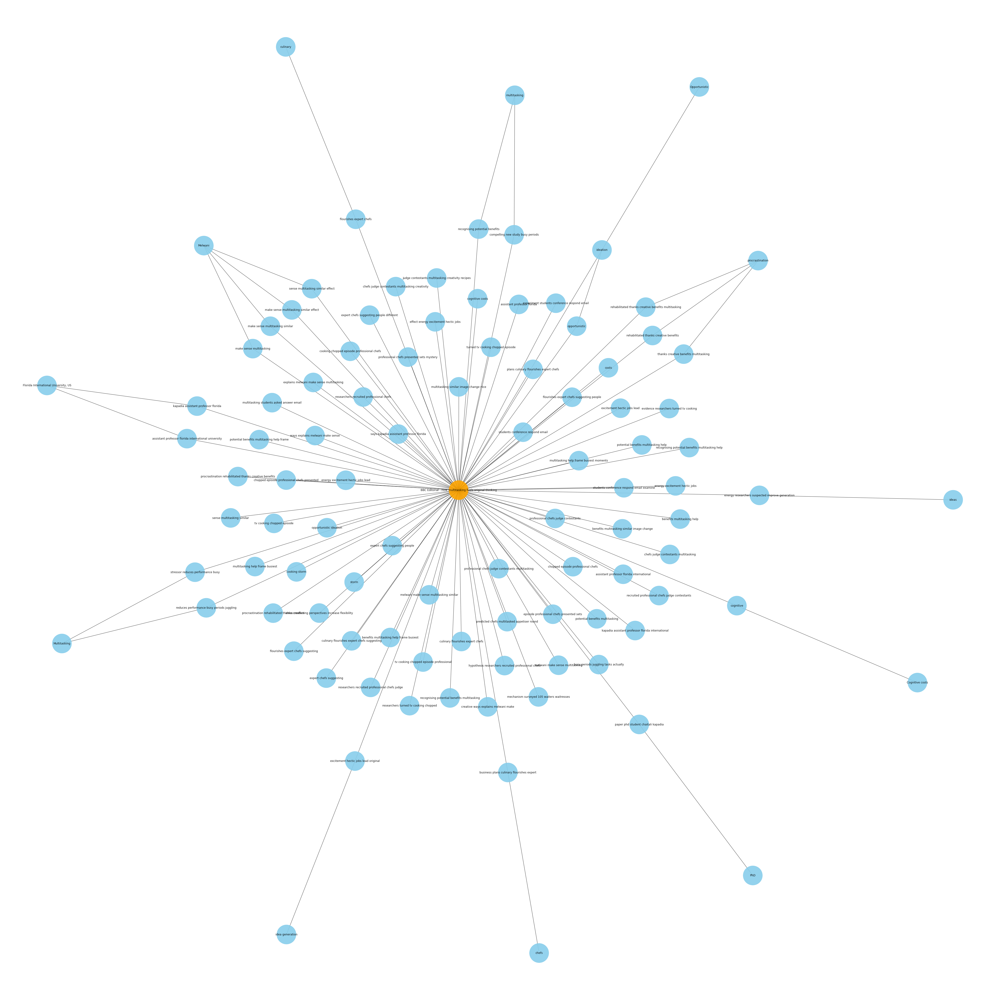

In [ ]:
print_graph_from_dict(bbc_dict)